# Débruitage de Vuvuzela



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy.io import wavfile
from IPython.display import Audio


## Introduction

### Contexte / Problématique

Lors de la coupe du Monde de Football 2010, les téléspectateurs du monde entier ont pu découvrir un instrument de musique d’Afrique du Sud : le Vuvuzela. Passé la phase d’étonnement, le son continu généré par cet instrument est rapidement devenu gênant lors de la diffusion des matchs ([youtube](https://www.youtube.com/watch?v=bKCIFXqhLzo)). Dans ce projet, nous allons mettre en place un filtre "anti-vuvuzela" pour atténuer les sonorités de cet instrument.

<figure style="padding:40px;align:center">
<img style="width: 400px" src="https://i.dailymail.co.uk/i/pix/2010/06/13/article-1286265-09FE0925000005DC-48_468x299.jpg">
</figure>

### Méthodologie

In [2]:
Fs,data = wavfile.read("./vuvuzela.wav")     #read wavefile
data = data/(1.1*max(abs(data)))               # normalisation
Audio(data,rate=Fs)

Le repo gitlab contient un enregistrement sonore nommé `vuvuzela.wav` dans le repertoire `wav`. Cet enregistrement a été réalisé lors d’un match de la coupe du monde 2010. Pour supprimer les sonorités de Vuvuzela, nous allons procéder de la manière suivante :

1. Analyse du contenu spectral du fichier `vuvuzela.wav`.
2. Analyse de différents "rejecteurs" avec Python :`
    * un filtre RLC,
    * un filtre Twin T passif,
    * un filtre Twin T actif.
3. Etude expérimentale d’un des deux filtres passifs :
    * Détermination expérimentale de la résistance interne d’une bobine et réglage de la résistance de
compensation à rajouter dans la branche capacitive du RLC.
    * Détermination expérimentale du coefficient d’amortissement du twin T passif par mesure de la
 bande rejetée à partir du déphasage entre les signaux d’entrée et de sortie.
4. Implémentation des différents Twin T actif nécessaires pour rejeter les différentes harmoniques du son à éliminer. Preuve sur LTspice.
5. Répartition des différentes cellules à câbler entre les différents groupes.
6. Câblage de la cascade et test de l’ensemble sur le signal audio fourni.

Pour chacune de ces étapes, vous devez rédiger un notebook Jupyter expliquant votre démarche et présentant vos différents résultats.

## Déroulement du Projet

### Analyse Spectrale


### Fonction Plot

In [3]:
def afficher(x,y, x_nom = "Temps [s]", y_nom="Amplification [V]"):
    plt.plot(t,data)
    plt.xlabel(x_nom)
    plt.ylabel(y_nom)
    plt.show()

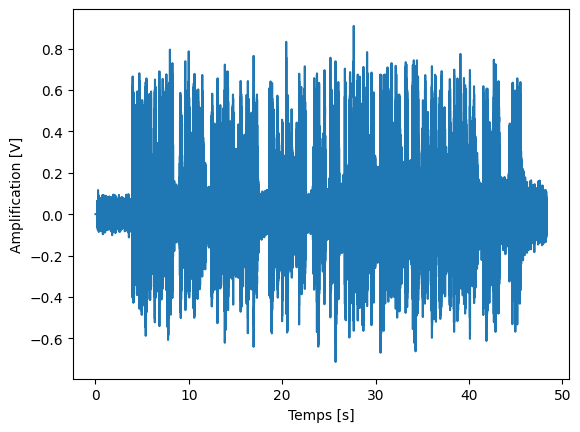

In [4]:
t = np.arange(len(data))/Fs        #convert sample index to time (in sec)plt.plot(t,data)
afficher(t,data)

La figure précédente affiche la représentation temporelle de l'enregistrement sonore à débruiter. Cet enregistrement contient des parties contenant uniquement les sonorités de Vuvuzela (entre 0 et 2s par exemple) et d'autres parties contenant les sonorités de Vuvuzela ainsi que des commentaires de journalistes sportifs.
Mathématiquement, les sonorités de Vuvuzela peuvent être modélisés par une somme de plusieurs sinusoïdes de fréquence $f_l$ c-a-d

$$x(t) = \sum_{l=1}^L a_l sin(2\pi f_l l t + \varphi_l)$$

Dans un premier temps, il est nécessaire de déterminer les fréquences $f_1$,$\cdots$, $f_L$ en réalisant une analyse spectrale (c-a-d fréquentielle) de l’enregistrement sonore. L'analyse pourra être réalisée en utilisant Python. Ccette partie nécessitera d’utiliser la fonctionnalité suivante :

* Estimation du spectre: [Documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.periodogram.html)

**Question 1.** En utilisant `python`, représentez le contenu temporel puis fréquentiel de l'enregistrement sonore.

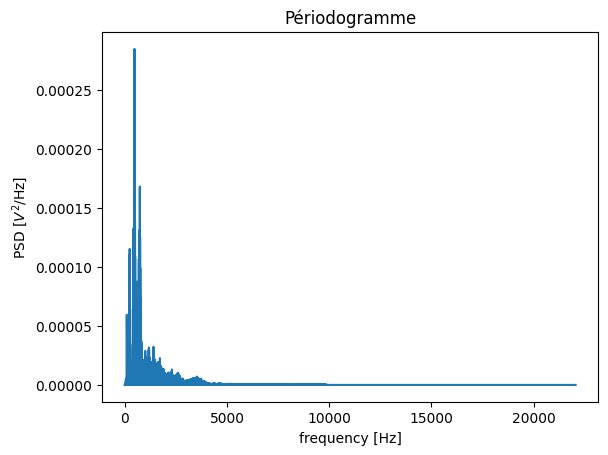

In [5]:
def periodogramme(samples,echantillonage):
    return signal.periodogram(samples, echantillonage)

def periodogramme_affichage(samples, echantillonage):
    f, Pxx_den = signal.periodogram(samples, echantillonage)
    plt.plot(f, Pxx_den)
    plt.xlabel('frequency [Hz]')
    plt.ylabel('PSD [$V^2$/Hz]')
    plt.title("Périodogramme")
    plt.show()

periodogramme_affichage(data,Fs)

**Question 2**. Isolez une portion temporelle de l’enregistrement sonore ne contenant que des sonorités de Vuvuzela (pas de commentaires sportifs). Représentez alors le contenu fréquentiel de cette portion.



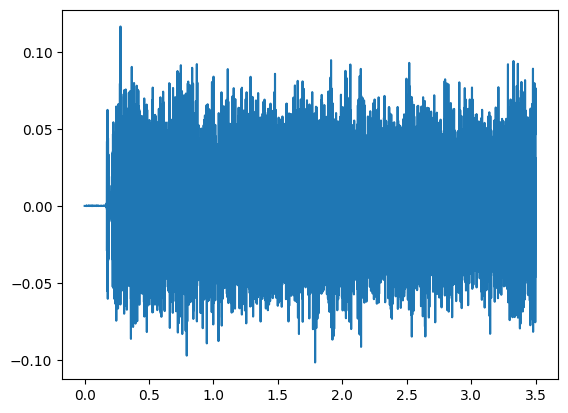

In [6]:
indice = [i for i in t].index(3.5)
t_vuvu = t[0:indice]
data_vuvu = data[0:indice]
plt.plot(t_vuvu, data_vuvu)

**Question 3.** Identifiez les composantes fréquentielles du son de Vuvuzela c-a-d les valeurs de $f_l$ ($k = 1,\cdots,L$). Retrouvez alors l'unique note de la gamme tempérée qu'est capable de générer le Vuvuzela.

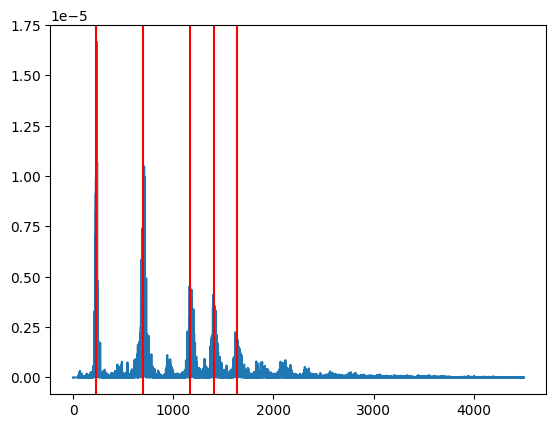

composantes fréquentielles du son :  [234.0, 702.0, 1170.0, 1404.0, 1638.0]
unique note de la gamme tempérée :  234.0


In [7]:
f_l = []
x,y = periodogramme(data_vuvu, Fs)
new_x = [i for i in x]
ind = new_x.index(4500)
cut_x = [i for i in x[0:ind]]
cut_y = [i for i in y[0:ind]]

note = cut_x[cut_y.index(np.amax(cut_y))]

plt.plot(cut_x,cut_y)
harmonics = [1,3,5,6,7]
for i in harmonics:
    plt.axvline(x = note * i, color = 'r', label = 'Note')
    f_l.append(note * i)
plt.show()

print("composantes fréquentielles du son : ", f_l)
print("unique note de la gamme tempérée : ", note)

## Détermination du coefficient d'amortissement pour les filtres:

Afin d'établir une bonne étude des filtres suivants, il faut d'abord choisir un bon facteur de qualité pour le filtre rejecteur. On réalise ainsi une série de tests numériquement pour voir pour quelles valeurs de **m** notre signal est le mieux filtré:



### Etablissement des fonctions nécessaires pour les calculs:

In [8]:
def notch(f0, audio, Q):
    w0 = f0 / (Fs / 2)
    b, a = signal.iirnotch(w0, Q)
    return signal.lfilter(b,a, audio)

In [9]:
def periodogramme_compare(samples1, samples2, echantillonage):
    f, Pxx_den = signal.periodogram(samples1, echantillonage)
    f2, Pxx_den2 = signal.periodogram(samples2, echantillonage)
    plt.plot(f[:10000], Pxx_den[:10000])
    plt.plot(f2[:10000], Pxx_den2[:10000])
    print(len(Pxx_den), len(Pxx_den2))
    plt.show()

In [10]:
def filter_harmonics(f0, harmonics, signal, Q):
    x = signal
    for i in harmonics:
        x = notch(f0 * i, x, Q)
    return x

### Test avec plusieurs valeurs du facteur de qualité:

77176 77176


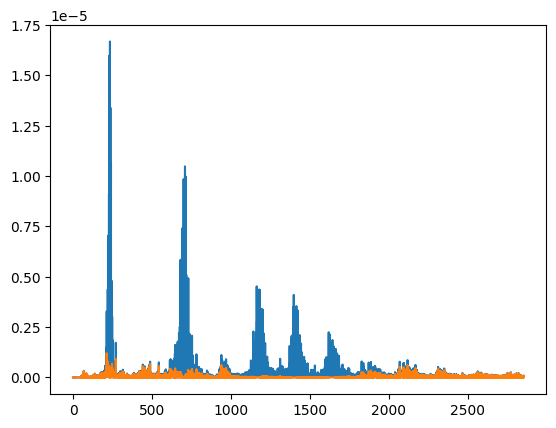

In [11]:
Q = 4
harmonics = [1,3,5,6,7]
f0 = 234
filtered_data = filter_harmonics(f0, harmonics, data_vuvu, Q)
periodogramme_compare(data_vuvu, filtered_data,Fs)

In [12]:
print("m vaut : " + str(1/(2*Q)))

m vaut : 0.125


**On choisit ainsi un m qui vaut 0.125**
$$\boxed{ m = 0.125}$$

## Filtre rejecteur RLC

Dans un premier temps, nous allons considérer le rejecteur RLC suivant :

<figure style="padding:40px;align:center">
<img style="width: 250px" src="./img/RLC.png">
<figcaption style='text-align:center;padding-top:20px;font-style: italic;'>Fig. Filtre RLC</figcaption>
</figure>

**Question 4.** Analyse du Filtre

* Déterminez la fonction de transfert $H(p)$ de ce rejecteur.
* Déterminez l’expression du coefficient d’amortissement m et de la pulsation propre ω0 en fonction des différents composants du filtre.
* A partir d’une analyse théorique, déterminez les pôles et les zeros de ce filtre. Montrez ensuite que ce filtre permet de supprimer complètement une composante fréquentielle f particulière (expression de f à déterminer). Déterminez théoriquement l’expression de la largeur de la bande rejetée à −3dB, puis l’expression du gain en basse-et haute fréquence de ce filtre.
* En utilisant Python, réalisez une étude complète de ce filtre (réponse indicielle, réponse fréquentielle).

‣ **Rejecteur:**

$$\dfrac{T_0 \left(\frac{1}{\omega_0^2}p^2 + 1\right)}{\frac{1}{\omega_0²}p^2 + \frac{2.m}{\omega_0}.p +1}$$


‣ **Fonction de Transfert:**

Impédance équivalente:
$$Z_{LC} = Z_L + Z_C = Lp + \frac1{Cp} = \dfrac{LC.p^2 +1}{C.p}$$

Fonction de Transfert:
\begin{equation}
    H(p) = \dfrac{Z_{LC}}{Z_{LC} + Z_R} \\
    \Leftrightarrow
    \boxed{ H(p) = \dfrac{LC.p^2 + 1}{LC.p^2 + RC.p +1}}
\end{equation}


‣ **Identification:**

On remarque que pour ce filtre $T_0 = 1$. On procède ainsi à déterminer les expressions de $m$, $\omega_0$ et $\Delta \omega$:

\begin{equation}
    \boxed{
        \omega_0 = \dfrac{1}{\sqrt{LC}} \\
        m = \dfrac{RC}{2\sqrt{LC}} \\
        \Delta \omega = \dfrac{R}{L}
        }
\end{equation}

‣ **Pôles :**

Pour déterminer les pôles, on détermine les racines du dénominateur de la fonction de transfert :
$$ LC.p^2 + RC.p + 1 = 0 $$

On calcul le discriminant :
$$ \Delta = (RC)^2 - 4LC $$

Alors, on obtient comme pôles :
\begin{equation}
    \boxed{
        p_1 = \frac{-RC + \sqrt{(RC)^2 - 4LC}}{2LC} \\
        p_2 = \frac{-RC - \sqrt{(RC)^2 - 4LC}}{2LC}
        }
\end{equation}


‣ **Zéros :**

Pour déterminer les zéros, on détermine les racines du numération de la fonction de transfert :
$$ LC.p^2 + 1 $$

On calcul le discriminant :
$$ \Delta = -4LC < 0 $$

Alors, on obtient comme zéros :
\begin{equation}
    \boxed{
        z_1 = j \frac{1}{\sqrt{LC}} \\
        z_2 = - j \frac{1}{\sqrt{LC}}
        }
\end{equation}


‣ **Composante fréquentielle f particulière :**

On sait que :
$$ \omega_0 = \frac 1{\sqrt{LC}} \leftrightarrow \omega_0 = 2 \pi f_0 $$

On a alors :
$$ \boxed{f_0 = \frac 1 {2 \pi \sqrt{LC}}} $$


‣ **Largeur de la bande rejetée à −3dB :**
\begin{equation}
    \boxed{
        \Delta \omega = 2m\omega_0  \Leftrightarrow  \Delta \omega = \dfrac{R}{L} \\
        \Delta f = 2mf_0   \Leftrightarrow   \Delta f = \dfrac{R}{2 \pi L}
        }
\end{equation}

‣ **Expression du gain en basse fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

BF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

‣ **Expression du gain en haute fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

HF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

‣ **Etude du filtre avec Python**
* Pour l'étude fréquencielle et indicielle de ce filtre, on utilise le programme "Analog Filter Analysis":
https://github.com/YassineSE/Simple-Analog-Filter-Simulator-with-Python


Il nous reste plus que rentrer les données de ce filtre et effectuer la simulation.

Avant de faire l'étude du filtre, il faut d'abord calculer les valeurs de $\omega _0$ et de m.

On sait que $f_0 = 234 \; Hz$ alors:
$$ \boxed{\omega _0 \; = \; 1470.27 \; rad.s^{-1}} $$


$$ \boxed{m = 0.125}$$

Maintenant nous pouvons faire l'analyse de la réponse fréquentielle et indicielle du filtre:

**1. Réponse indicielle :**
<img src ="./img/RLC_NOTCH_step_resp.png" >



**2. Réponse fréquentielle :**
<img src ="./img/RLC_NOTCH_freq_resp.png" >



**Question 5.** Analyse de la mise en cascade (Python/ LT-spice)

Pour supprimer les différentes composantes fréquentielles du Vuvuzela, nous allons cascader plusieurs rejecteurs RLC en série.

* Sous l’hypothèse que $R = R_1 = \cdots = R_L$ et que le coefficient d'amortissement $m$ est égal pour chaque étage RLC, réalisez un script python pour déterminer automatiquement les valeurs des composants $L$ et $C$ de chaque étage. Ces valeurs seront déterminées de manière à filtrer les différentes composantes fréquentielles $f_l$.
* Câblez le filtre cascadé sous LT-spice.
* Analysez la réponse fréquentielle du filtre cascadé.
* En utilisant les fonctionnalités audio de LT-spice, importez le fichier sonore vuvuzela.wav puis sauvegardez le signal de sortie dans un fichier sonore au format `wav`. Modifiez votre valeur de m de manière à obtenir un résultat sonore acceptable.

In [13]:
m = 0.01
R = 69e3  # Ohm
C = []    # Farad
L = []    # Henry

for i in range(len(f_l)) :
    C.append(m / (np.pi * R * f_l[i]))
    L.append(1 / (((2 * np.pi * f_l[i])**2) * C[i]))
print(C, L)

[1.971447331746505e-10, 6.571491105821684e-11, 3.9428946634930105e-11, 3.285745552910842e-11, 2.816353331066436e-11] [2346.5151866112774, 782.1717288704257, 469.3030373222554, 391.08586443521284, 335.2164552301824]


**Circuit filtre rejecteur RLC**
<img src ="./img/passiv_RLC_ltspice.png" >



**Comportement fréquenciel du filtre rejecteur RLC**
<img src ="./img/passiv_RLC_courbe.png" >

In [14]:
Audio("ltspice/wav/rlc_1.wav")

**Question 6.**

* En renseignant le paramètre série résistance de la bobine, expliquez la problématique liée à ce type de filtre.
* Effectuer une recherche pour trouver les schémas permettant de compenser cette résistance de la branche inductive.
* Critiquer le choix de ce filtre.

La résistance interne de la bobine va affecter la précision de notre pulsation de coupure mais aussi notre facteur d'amortissement et ainsi la bande rejetée.

Le bon choix serait de rajouter des "buffers" (aop suiveurs) puisque leur entrée est à très basse impédance.

Ce filtre ne représente pas le bon choix pour notre projet, la résistance interne de la bobine va nous poser des problèmes de précision surtout lors de la mise en cascade de plusieurs filtres. De plus, même pour compenser la résistance de la branche inductive cela nous coûterait plus cher.

## Filtre rejecteur Twin-T

Pour éviter d’utiliser plusieurs bobines, nous allons maintenant considérer un filtre rejecteur Twin-T passif. Ce filtre est décrit dans la figure suivante :

<figure style="padding:40px;align:center">
<img style="width: 250px" src="./img/twinT.png">
<figcaption style='text-align:center;padding-top:20px;font-style: italic;'>Fig. Filtre Twin-T</figcaption>
</figure>

**Question 7.** Analyse du Filtre

* Similaire à la question 4.




‣ **Fonction de Transfert:**

$$ \boxed{ H(p) = \dfrac{1 + (RC)^2 p^2}{1 + 4RCp + (RC)^2 p^2}}$$

‣ **Identification:**

$$\boxed{\omega _0 = \dfrac{1}{RC}}$$

On sait que $\frac{2m}{\omega_0} = 4RC$ d'où:

$$m = 2RC \times \omega_0 = \frac{2RC}{RC}$$
$$\boxed{m = 2}$$


‣ **Pôles:**

On pose $D(p) = (RC)^2 p^2 + 4RCp + 1 = 0$.

Dicriminant :
$$ \Delta = (4RC)^2 - 4(RC)^2 = 16(RC^2) - 4(RC)^2 = 12(RC)^2 > 1 $$

On obtient alors comme pôles :
$$\boxed{
\begin{equation}
    p_1 = \frac 1{RC}(-2-\sqrt{3}) \\
    p_2 = \frac 1{RC}(-2+\sqrt{3})
\end{equation}
}$$


‣ **Zéros:**

On pose $N(p) = (RC)^2 p^2 + 1 = 0$. 

$$\boxed{
\begin{equation}
z_1 = \frac{j}{RC} \\
z_2 = \frac{-j}{RC}
\end{equation}
}$$


‣ **Composante fréquentielle f particulière :**

On sait que :
$$ \omega_0 = \frac {1}{RC} \leftrightarrow \omega_0 = 2 \pi f_0 $$

On a alors :
$$ \boxed{f_0 = \frac 1 {2 \pi RC}} $$


‣ **Largeur de la bande rejetée à −3dB :**
\begin{equation}
    \boxed{
        \Delta \omega = 2m\omega_0  \Leftrightarrow  \Delta \omega = \dfrac{2}{RC} \\
        \Delta f = 2mf_0   \Leftrightarrow   \Delta f = \dfrac{1}{ \pi RC}
        }
\end{equation}

‣ **Expression du gain en basse fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

BF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

**Expression du gain en haute fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

HF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

‣ **Etude du filtre:**

On utilise le même logiciel pour simuler la réponse indicielle et fréquencielle.

On sait que: $w_0 = 1470.27, \; m=2\; et \; T_0 = 1$.

On obtient alors les graphes suivants:

* Réponse fréquentielle:
<img src="./img/RC_Twin_T_freq_resp.png">

* Réponse indicielle:
<img src="./img/RC_Twin_T_step_resp.png">

**Question 8.** Analyse de la mise en cascade (Python/ LT-spice)

* Similaire à la question 5.



In [15]:
m = 2 
C = 10**-8 #F
f0 = 234 #Hz
harmonics = [1,3,5,6,7]
liste_R = []

for i in harmonics:
    liste_R.append(1/(2 * np.pi * f0 * i * C))
    
values = dict(zip(harmonics, liste_R))
values

{1: 68014.93294525442,
 3: 22671.644315084806,
 5: 13602.986589050883,
 6: 11335.822157542403,
 7: 9716.418992179202}

**Circuit filtre rejecteur Twin-T**
<img src ="./img/twin_t_passif_ltspice.png" >



**Comportement fréquenciel du filtre rejecteur Twin-T**
<img src ="./img/twin_t_passif_courbe.png" >

In [16]:
Audio("ltspice/wav/twin_t_passif_1.wav")

**Question 9.** 

* Critiquer le choix de ce filtre.

Nous n'allons pas utiliser ce filtre puisque le coéfficient d'amortissement est constant: $m = 2$. 

Ce qui nous donne un facteur de qualité $Q = 0.25$. Or nous voulons dimensionner un filtre un filtre avec un facteur de qualité bien supérieur.

## Filtre rejecteur Twin-T actif

Le filtre précédent ne permet pas d'obtenir des résultats sonores satisfaisants. Pour améliorer le résultat sonore, il est possible d'utiliser un filtre Twin-T actif. Contrairement au filtre Twin-T passif, le filtre Twin-T actif permet le contrôle du coefficient d'amortissement $m$. Le tutoriel [MT-225 d’Analog Devices](https://www.analog.com/media/en/training-seminars/tutorials/MT-225.pdf) décrit la structure de ce filtre et donne plusieurs recommandations pour choisir les composants.

* Voir aussi: https://www.analog.com/media/en/training-seminars/design-handbooks/basic-linear-design/chapter8.pdf#page=105 

<img src="./img/twinT_actif.png" width="500">

**Question 10.** Analyse du Filtre

* Similaire à la question 4.



**Fonction de Transfert:**

Selon la documentation, la fonction de transfert peut s'écrire sous la forme:

$$H(p) = \dfrac{p^2 + w_0 ^2}{p^2 + p \frac{w_0}{Q} + w_0 ^2}$$

$$\boxed{H(p) = \dfrac{p^2 + \left ( \dfrac{1}{RC} \right) ^2}{p^2 + p . \left(\dfrac{1}{RC}\right). \left(\dfrac{4}{1 + \dfrac{R_5}{R_4}} \right) + \left( \dfrac{1}{RC} \right)^2}}$$

On remarque que: $R_1 = R_2 = R, \; R_3 = \frac{R}{2}, \; C_1 = C_2 = C \; et \; C_3 = 2C$

‣ **Identification:**

Sachant que $Q = \dfrac{1}{2m}$, on obtient: 

$$\boxed{\omega _0 = \dfrac{1}{RC}}$$

$$\boxed{ m = \dfrac{2}{1 + \dfrac{R_5}{R_4}}}$$

‣ **Pôles:**

$$\frac{p^2}{w_0 ^2} + p\frac{2m}{w_0} + 1 = 0$$

$$\Leftrightarrow (RC)^2 p^2 + \dfrac{4RC}{1 + \dfrac{R_5}{R_4}} + 1 = 0$$

$$\Delta = 4(RC)^2 . \left(\dfrac{ 3 R_4 - R_5}{R_4 + R_5} \right)$$

d'où:

$$\boxed{p_{1/2} = \dfrac{\left(\dfrac{2R_4}{R_4 + R_5} \right) \pm \sqrt{\dfrac{3R_4 - R_5}{R_4 + R_5}}}{RC}}$$

‣ **Zéros:**

On pose $(RC)^2 p^2 + 1 = 0$. 

$$\boxed{
\begin{equation}
z_1 = \frac{j}{RC} \\
z_2 = \frac{-j}{RC}
\end{equation}
}$$


‣ **Composante fréquentielle f particulière :**

On sait que :
$$ \omega_0 = \frac {1}{RC} \leftrightarrow \omega_0 = 2 \pi f_0 $$

On a alors :
$$ \boxed{f_0 = \frac 1 {2 \pi RC}} $$


‣ **Largeur de la bande rejetée à −3dB :**

$$
\begin{equation}
    \boxed{
        \Delta \omega = 2m\omega_0 = \dfrac{\omega_0}{Q} = \left(\dfrac{1}{RC} \right) \left( \dfrac{4}{1 + \dfrac{R_5}{R_4}} \right)\\
        \Delta f = \left(\dfrac{1}{\pi RC} \right) \left( \dfrac{2}{1 + \dfrac{R_5}{R_4}} \right)   
        }
\end{equation}
$$

‣ **Expression du gain en basse fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

BF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

‣ **Expression du gain en haute fréquence de ce filtre :**

On pose: $p = j\omega$. Obtient alors:

HF: $$\boxed{|H(j\omega)| = T_0 = 1}$$

‣ **Etude du filtre:**

On utilise le même logiciel pour simuler la réponse indicielle et fréquencielle.

Ce filtre nous permet de choisir la valeur du coéfficient d'amortissement sans changer la valeur de la pulsation de cassure. Pour dimensionner un bon filtre (atténuation de -60dB à la fréquence de cassure), on choisira un $m = 0.005$.

Nos valeures caractéristiques: $w_0 = 1470.27, \; m=0.005\; et \; T_0 = 1$.

On obtient alors les graphes suivants:

* Réponse fréquentielle:
<img src ="./img/RLC_NOTCH_freq_resp.png" >

* Réponse indicielle:
<img src ="./img/RLC_NOTCH_step_resp.png" >

**Question 11.** Analyse de la mise en cascade (Python/ LT-spice)

* Similaire à la question 5.



In [17]:
C = 100e-9 #F
C1 = C; C2 = C; C3 = C*2
f0 = 234 #Hz
m = 0.181

R4 = 10e3 #Ohm
R5 = R4*((2/m)-1)
print("R4 = ", R4, "\nR5 = ", R5)

harmonics = [1,3,5,6,7]
liste_R = []

for i in harmonics:
    liste_R.append(1/(2 * np.pi * f0 * i * C))
    
values = dict(zip(harmonics, liste_R))
values

R4 =  10000.0 
R5 =  100497.23756906077


{1: 6801.493294525442,
 3: 2267.1644315084804,
 5: 1360.2986589050886,
 6: 1133.5822157542402,
 7: 971.6418992179202}

**Circuit filtre rejecteur Twin-T actif**
<img src ="./img/twin_t_actif_ltspice.png" >



**Comportement fréquenciel du filtre rejecteur Twin-T actif**
<img src ="./img/twin_t_actif_courbe.png" >

In [18]:
Audio("ltspice/wav/twin_t_actif_1.wav")

**Question 12.** 

* Critiquer le choix de ce filtre.

Ce filtre nous semble être le meilleur compromis. Ce dernier permet le choix d'un facteur de qualité bien élevé qui ne change pas la valeur de la pulsation de cassure. 